<a href="https://colab.research.google.com/github/LydiaDEdou/projet/blob/main/TP_UNET.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
dataset, info = tfds.load('oxford_iiit_pet', with_info=True)


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

In [ ]:
def resize(input_image, input_mask):
    return tf.image.resize(input_image, (128, 128)), tf.image.resize(input_mask, (128, 128))

In [ ]:
def augment(input_image, input_mask):
   if tf.random.uniform(()) > 0.5:
       input_image = tf.image.flip_left_right(input_image)
       input_mask = tf.image.flip_left_right(input_mask)
   return input_image, input_mask

In [ ]:
def normalize(input_image, input_mask):
    return tf.cast(input_image, tf.float32) / 255.0, input_mask - 1

In [ ]:
def load_image_train(datapoint):
   input_image = datapoint["image"]
   input_mask = datapoint["segmentation_mask"]
   input_image, input_mask = resize(input_image, input_mask)
   input_image, input_mask = augment(input_image, input_mask)
   input_image, input_mask = normalize(input_image, input_mask)
   return input_image, input_mask

def load_image_test(datapoint):
   input_image = datapoint["image"]
   input_mask = datapoint["segmentation_mask"]
   input_image, input_mask = resize(input_image, input_mask)
   input_image, input_mask = normalize(input_image, input_mask)
   return input_image, input_mask

In [ ]:
train_dataset = dataset["train"].map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = dataset["test"].map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
train_batches = train_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_batches = train_batches.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validation_batches = test_dataset.take(3000).batch(BATCH_SIZE)
test_batches = test_dataset.skip(3000).take(669).batch(BATCH_SIZE)

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


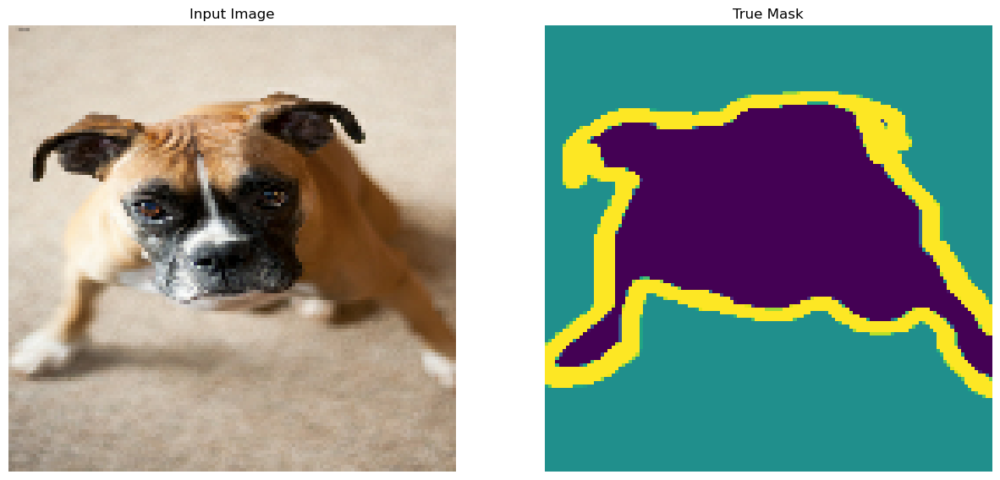

In [ ]:
def display(display_list):
 plt.figure(figsize=(15, 15))
 title = ["Input Image", "True Mask", "Predicted Mask"]
 for i in range(len(display_list)):
   plt.subplot(1, len(display_list), i+1)
   plt.title(title[i])
   plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
   plt.axis("off")
 plt.show()
sample_batch = next(iter(train_batches))
random_index = np.random.choice(sample_batch[0].shape[0])
sample_image, sample_mask = sample_batch[0][random_index], sample_batch[1][random_index]
display([sample_image, sample_mask])

In [ ]:
def double_conv_block(x, n_filters):
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
   x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
   return x

In [ ]:
def downsample_block(x, n_filters):
   f = double_conv_block(x, n_filters)
   p = layers.MaxPool2D(2)(f)
   p = layers.Dropout(0.3)(p)
   return f, p

In [ ]:
def upsample_block(x, conv_features, n_filters):
   x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
   x = layers.concatenate([x, conv_features])
   x = layers.Dropout(0.3)(x)
   x = double_conv_block(x, n_filters)
   return x

In [ ]:
 def build_unet_model():
   inputs = layers.Input(shape=(128,128,3))
   f1, p1 = downsample_block(inputs, 64)
   f2, p2 = downsample_block(p1, 128)
   f3, p3 = downsample_block(p2, 256)
   f4, p4 = downsample_block(p3, 512)
   bottleneck = double_conv_block(p4, 1024)
   u6 = upsample_block(bottleneck, f4, 512)
   u7 = upsample_block(u6, f3, 256)
   u8 = upsample_block(u7, f2, 128)
   u9 = upsample_block(u8, f1, 64)
   outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)
   unet_model = tf.keras.Model(inputs, outputs, name="U-Net")
   return unet_model

In [ ]:
unet_model = build_unet_model()

In [ ]:
unet_model.compile(optimizer=tf.keras.optimizers.Adam(),
                  loss="sparse_categorical_crossentropy",
                  metrics="accuracy")

In [ ]:
NUM_EPOCHS = 5
TRAIN_LENGTH = info.splits["train"].num_examples
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VAL_SUBSPLITS = 5
TEST_LENTH = info.splits["test"].num_examples
VALIDATION_STEPS = TEST_LENTH // BATCH_SIZE // VAL_SUBSPLITS
model_history = unet_model.fit(train_batches,
                              epochs=NUM_EPOCHS,
                              steps_per_epoch=STEPS_PER_EPOCH,
                              validation_steps=VALIDATION_STEPS,
                              validation_data=test_batches,callbacks=tf.keras.callbacks.EarlyStopping(patience=3,restore_best_weights=True))

Epoch 1/5


2024-09-30 10:24:38.788812: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inU-Net/dropout_24/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


57/57 [==============================] - 42s 596ms/step - loss: 0.9318 - accuracy: 0.5730 - val_loss: 0.8748 - val_accuracy: 0.5506
Epoch 2/5
57/57 [==============================] - 33s 586ms/step - loss: 0.7699 - accuracy: 0.6455 - val_loss: 0.6794 - val_accuracy: 0.7158
Epoch 3/5
57/57 [==============================] - 33s 581ms/step - loss: 0.6599 - accuracy: 0.7196 - val_loss: 0.6539 - val_accuracy: 0.7218
Epoch 4/5
57/57 [==============================] - 33s 581ms/step - loss: 0.6052 - accuracy: 0.7465 - val_loss: 0.5740 - val_accuracy: 0.7621
Epoch 5/5
57/57 [==============================] - 33s 578ms/step - loss: 0.5599 - accuracy: 0.7672 - val_loss: 0.5429 - val_accuracy: 0.7749


In [ ]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]
def show_predictions(dataset=None, num=1):
  if dataset:
   for image, mask in dataset.take(num):
     pred_mask = unet_model.predict(image)
     display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
            create_mask(model.predict(sample_image[tf.newaxis, ...]))])
count = 0
for i in test_batches:
   count +=1
print("number of batches:", count)

number of batches: 11


2/2 [==============================] - 0s 63ms/step


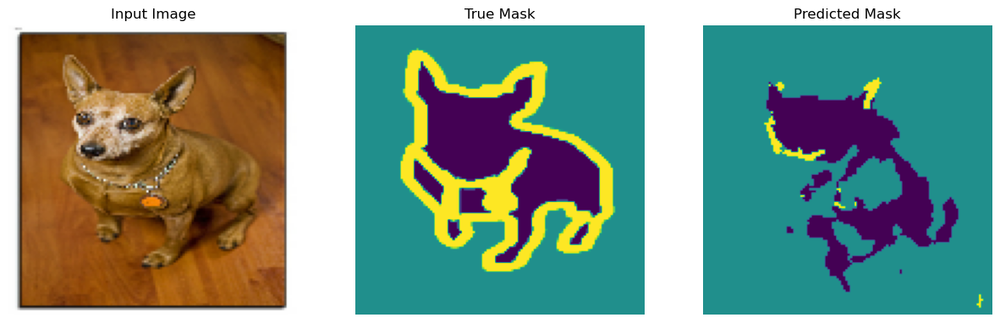

2/2 [==============================] - 0s 67ms/step


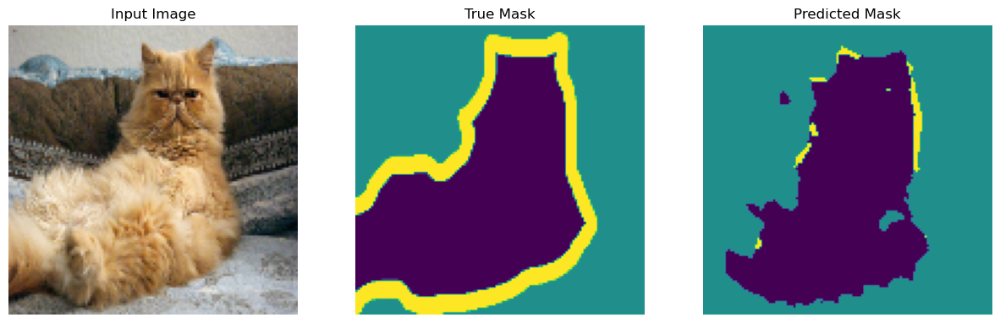

2/2 [==============================] - 0s 69ms/step


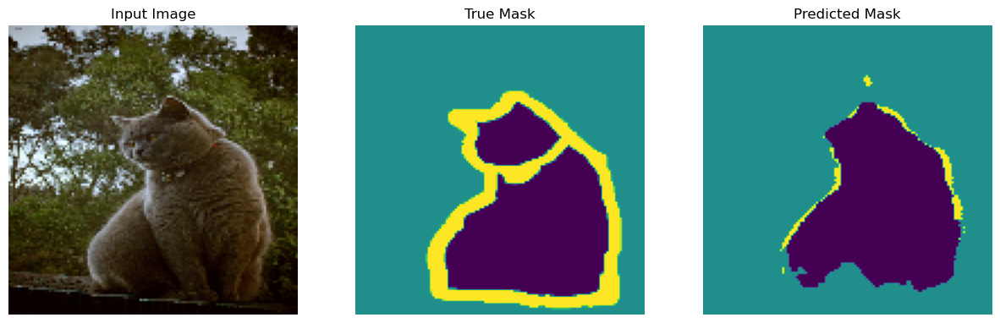

2/2 [==============================] - 0s 64ms/step


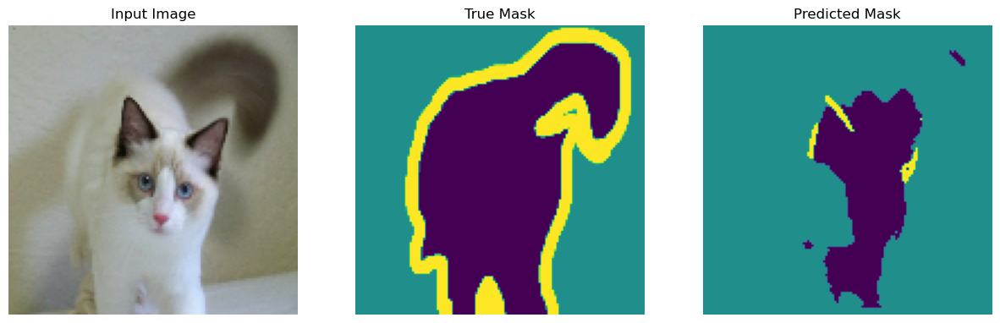

2/2 [==============================] - 0s 64ms/step


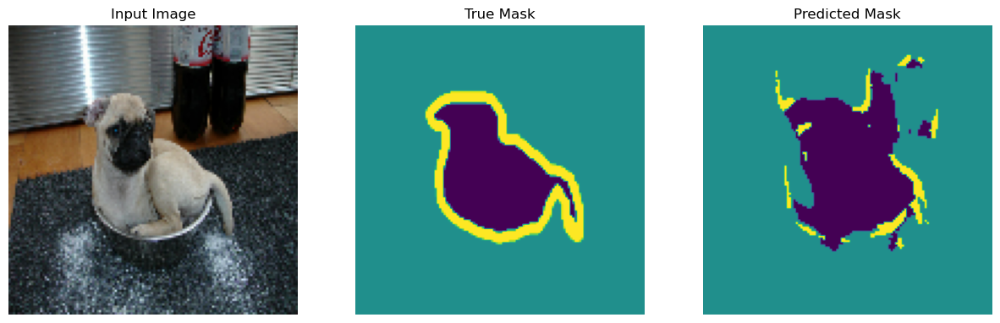

2/2 [==============================] - 0s 64ms/step


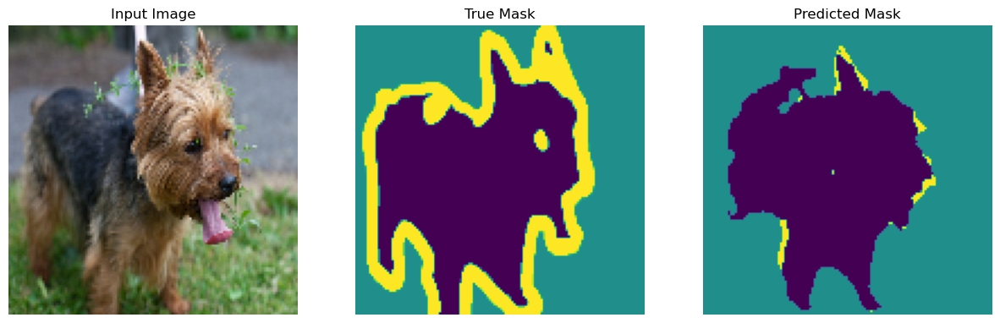

In [ ]:
show_predictions(test_batches, 6)

2/2 [==============================] - 0s 71ms/step


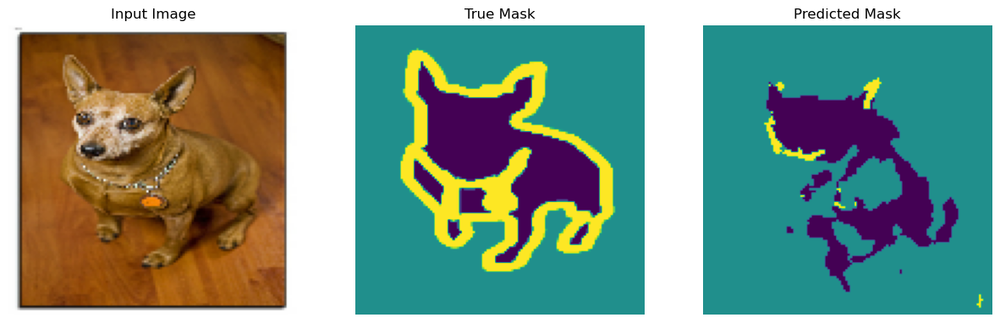

2/2 [==============================] - 0s 65ms/step


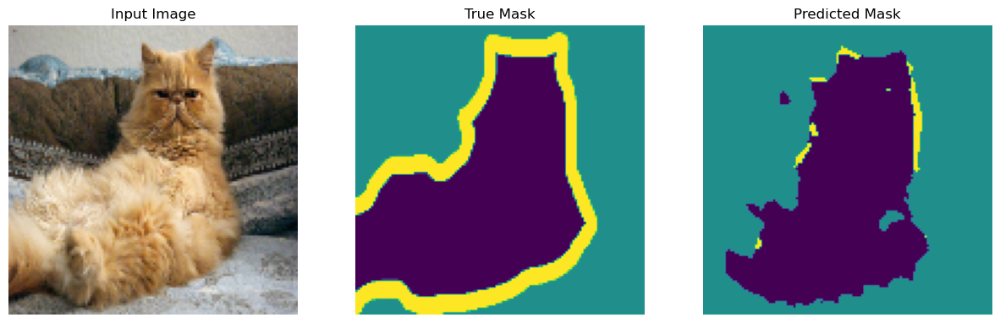

2/2 [==============================] - 0s 63ms/step


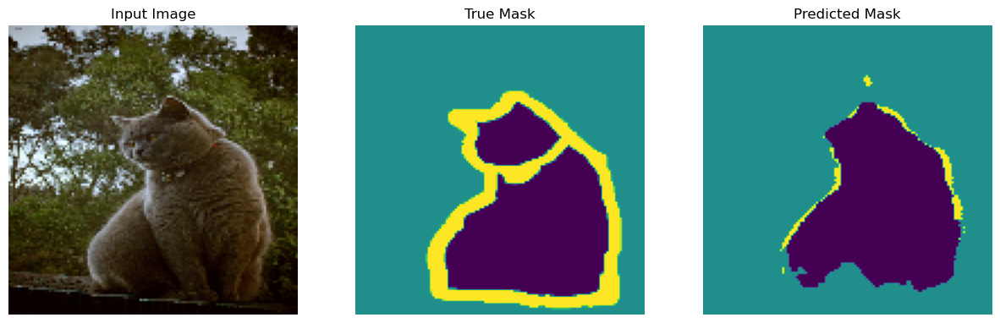

2/2 [==============================] - 0s 63ms/step


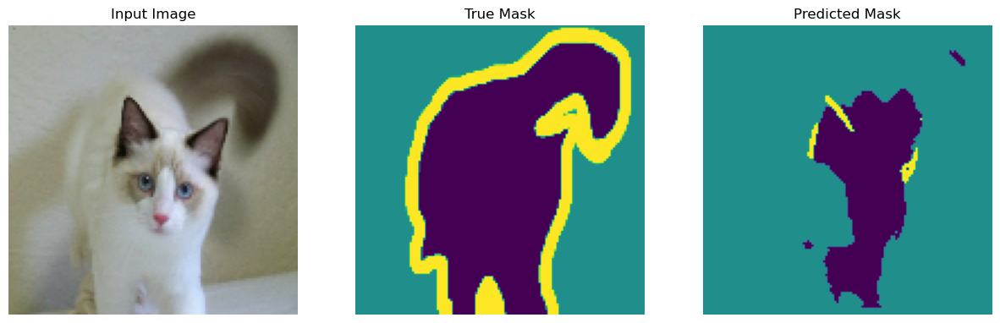

2/2 [==============================] - 0s 64ms/step


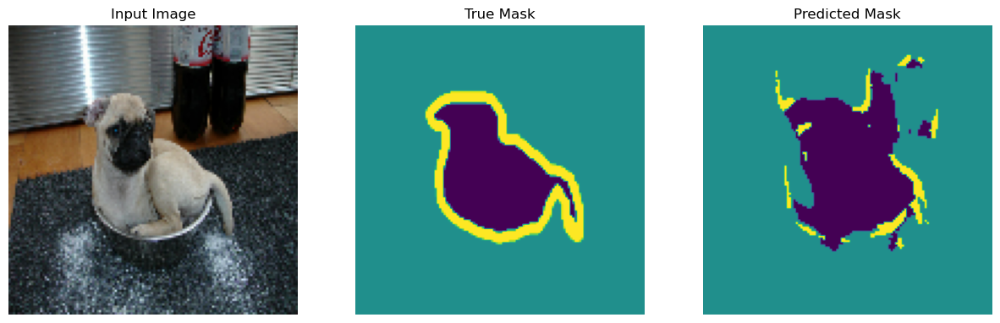

In [ ]:
show_predictions(test_batches, num=5)


In [ ]:
!pip install -U -q segmentation-models --user

from PIL import Image
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ["SM_FRAMEWORK"] = "tf.keras"

import segmentation_models as sm
import matplotlib.pyplot as plt
import tensorflow_io as tfio
import tensorflow as tf


root = '/kaggle/input/retinal-vessel-segmentation'
exts = ('jpg', 'JPG', 'png', 'PNG', 'tif', 'gif', 'ppm')

Segmentation Models: using `tf.keras` framework.


In [ ]:
input_data = os.path.join(root, 'DRIVE/training/images')
images = sorted(
    [
        os.path.join(input_data, fname)
        for fname in os.listdir(input_data)
        if fname.endswith(exts) and not fname.startswith(".")
    ]
)


target_data = os.path.join(root, 'DRIVE/training/1st_manual')
masks = sorted(
    [
        os.path.join(target_data, fname)
        for fname in os.listdir(target_data)
        if fname.endswith(exts) and not fname.startswith(".")
    ]
)

print("Number of samples:", len(images), len(masks))
for input_path, target_path in zip(images[:10], masks[:10]):
    print(input_path[-31:], "|", target_path[-34:])

Number of samples: 20 20
training/images/21_training.tif | training/1st_manual/21_manual1.gif
training/images/22_training.tif | training/1st_manual/22_manual1.gif
training/images/23_training.tif | training/1st_manual/23_manual1.gif
training/images/24_training.tif | training/1st_manual/24_manual1.gif
training/images/25_training.tif | training/1st_manual/25_manual1.gif
training/images/26_training.tif | training/1st_manual/26_manual1.gif
training/images/27_training.tif | training/1st_manual/27_manual1.gif
training/images/28_training.tif | training/1st_manual/28_manual1.gif
training/images/29_training.tif | training/1st_manual/29_manual1.gif
training/images/30_training.tif | training/1st_manual/30_manual1.gif


In [ ]:
IMAGE_SIZE = 512
BATCH_SIZE = 12

def read_files(image_path, mask=False):
    image = tf.io.read_file(image_path)
    if mask:
        image = tf.io.decode_gif(image) # out: (1, h, w, 3)
        image = tf.squeeze(image) # out: (h, w, 3)
        image = tf.image.rgb_to_grayscale(image) # out: (h, w, 1)
        image = tf.divide(image, 128)
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
        image = tf.cast(image, tf.int32)
    else:
        image = tfio.experimental.image.decode_tiff(image) # out: (h, w, 4)
        image = image[:,:,:3] # out: (h, w, 3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
        image = image / 255.
    return image

def load_data(image_list, mask_list):
    image = read_files(image_list)
    mask  = read_files(mask_list, mask=True)
    return image, mask

def data_generator(image_list, mask_list):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=False)
    return dataset

train_dataset = data_generator(images, masks)
train_dataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 512, 512, 1), dtype=tf.int32, name=None))>

In [ ]:
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(20, 20))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, cmap='gray')
    plt.show()

(12, 512, 512, 3) (12, 512, 512, 1)
0 1
[0 1]


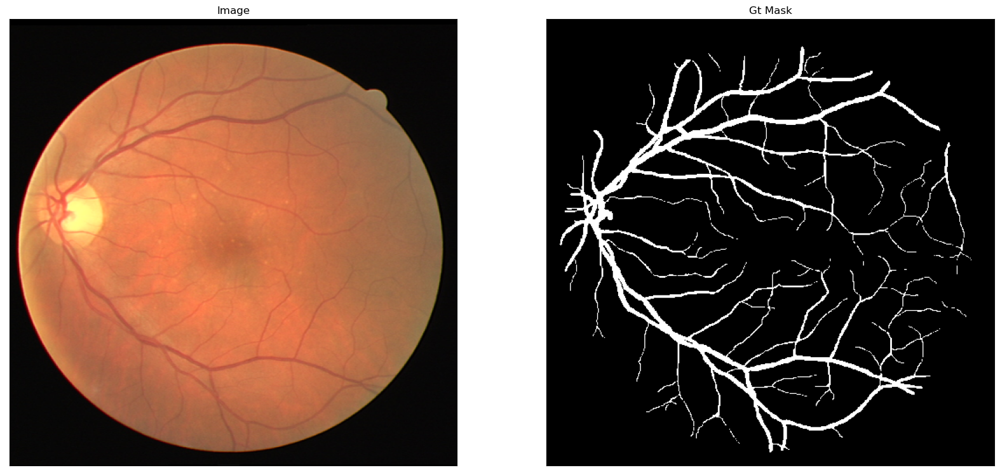

0 1
[0 1]


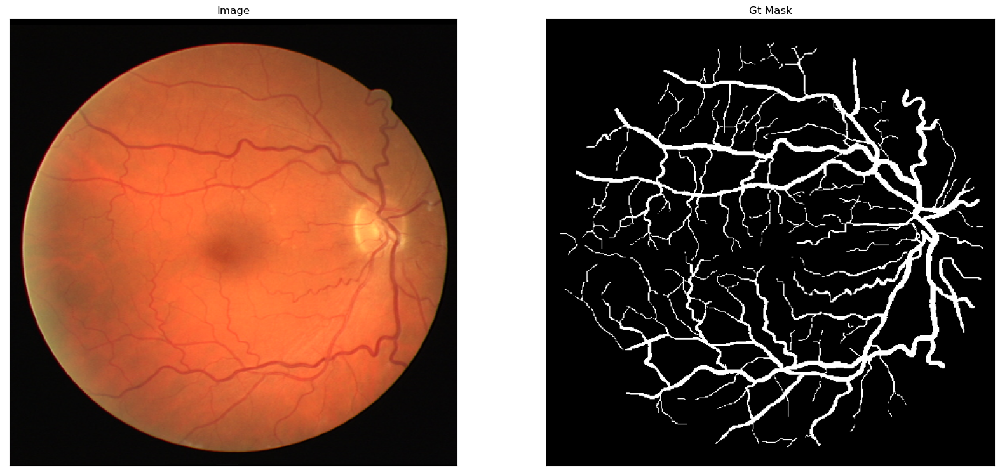

0 1
[0 1]


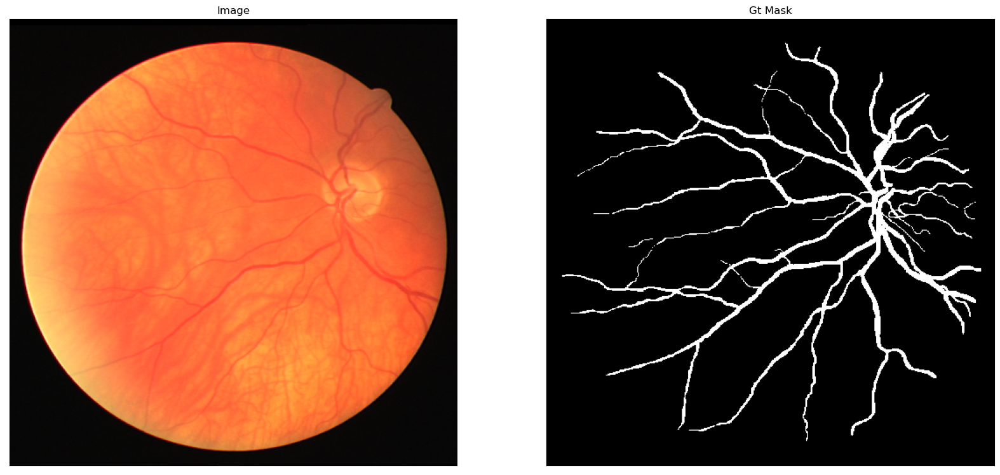

0 1
[0 1]


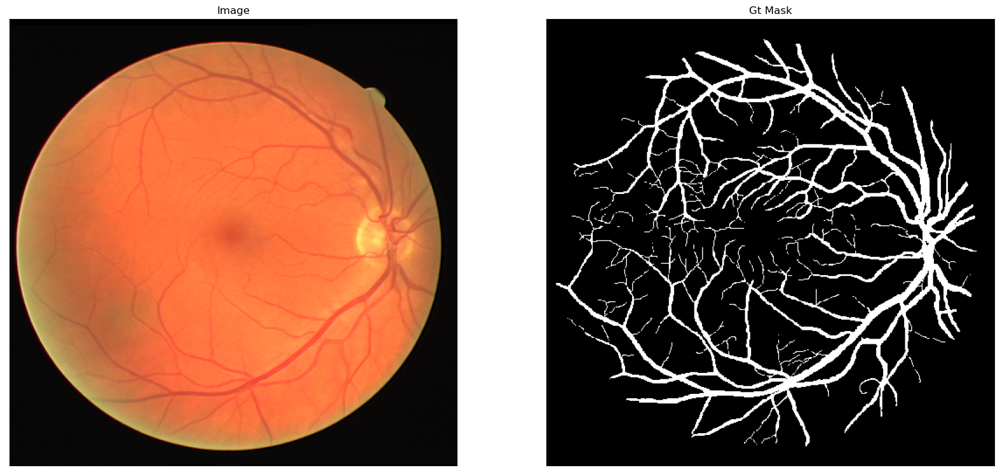

0 1
[0 1]


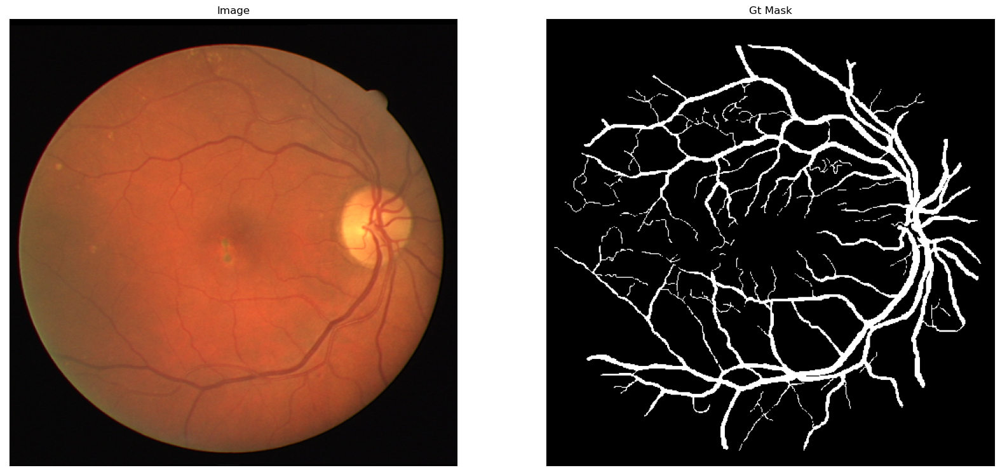

In [ ]:
image, mask = next(iter(train_dataset.take(1)))
print(image.shape, mask.shape)

for (img, msk) in zip(image[:5], mask[:5]):
    print(mask.numpy().min(), mask.numpy().max())
    print(np.unique(mask.numpy()))
    visualize(
        image=img.numpy(),
        gt_mask=msk.numpy(),
    )

In [ ]:
from tensorflow import keras

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()
BACKBONE   = 'efficientnetb0'
n_classes  = 1
activation = 'sigmoid'
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)

16804768/16804768 [==============================] - 0s 0us/step


In [ ]:
class DisplayCallback(keras.callbacks.Callback):
    def __init__(self, dataset, epoch_interval=3):
        self.dataset = dataset
        self.epoch_interval = epoch_interval

    def display(self, display_list, extra_title=''):
        plt.figure(figsize=(15, 15))
        title = ['Input Image', 'True Mask', 'Predicted Mask']

        if len(display_list) > len(title):
            title.append(extra_title)

        for i in range(len(display_list)):
            plt.subplot(1, len(display_list), i+1)
            plt.title(title[i])
            plt.imshow(display_list[i], cmap='gray')
            plt.axis('off')
        plt.show()

    def create_mask(self, pred_mask):
        pred_mask = (pred_mask > 0.5).astype("int32")
        return pred_mask[0]

    def show_predictions(self, dataset, num=1):
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            self.display([image[0], mask[0], self.create_mask(pred_mask)])

    def on_epoch_end(self, epoch, logs=None):
        if epoch and epoch % self.epoch_interval == 0:
            self.show_predictions(self.dataset)
            print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Epoch 1/30


2024-09-30 11:16:21.482933: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


2/2 [==============================] - 43s 424ms/step - loss: 0.5019 - accuracy: 0.8283
Epoch 2/30
2/2 [==============================] - 1s 435ms/step - loss: 0.4884 - accuracy: 0.8436
Epoch 3/30
2/2 [==============================] - 1s 436ms/step - loss: 0.4760 - accuracy: 0.8584
Epoch 4/30
1/1 [==============================] - 1s 1s/steploss: 0.4640 - accuracy: 0.86


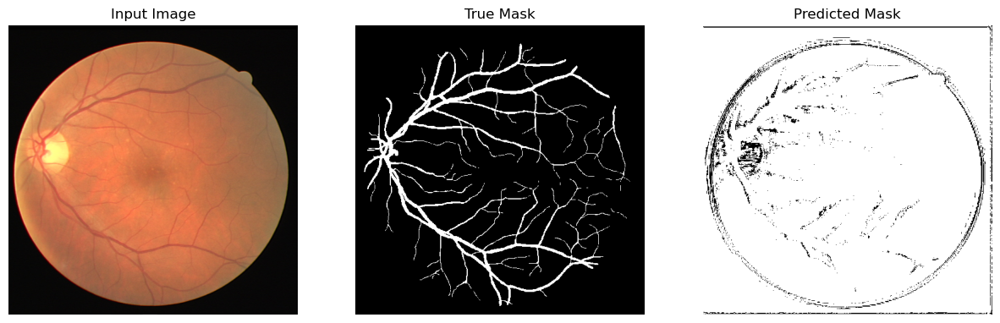


Sample Prediction after epoch 4

2/2 [==============================] - 3s 3s/step - loss: 0.4640 - accuracy: 0.8690
Epoch 5/30
2/2 [==============================] - 1s 422ms/step - loss: 0.4525 - accuracy: 0.8799
Epoch 6/30
2/2 [==============================] - 1s 438ms/step - loss: 0.4425 - accuracy: 0.8904
Epoch 7/30
1/1 [==============================] - 0s 59ms/stepss: 0.4321 - accuracy: 0.89


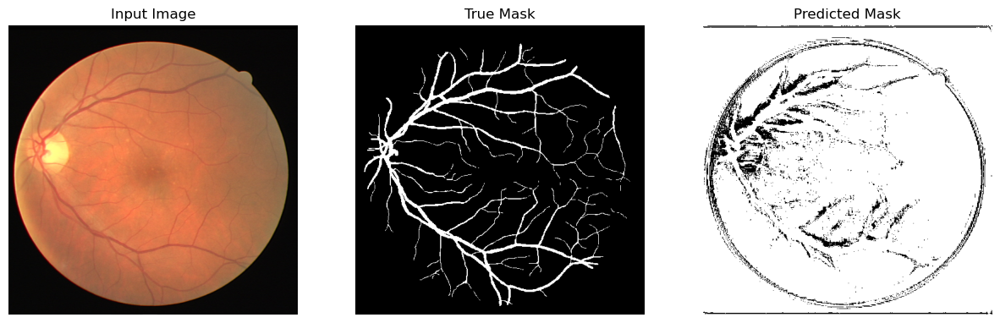


Sample Prediction after epoch 7

2/2 [==============================] - 2s 1s/step - loss: 0.4321 - accuracy: 0.8972
Epoch 8/30
2/2 [==============================] - 1s 430ms/step - loss: 0.4226 - accuracy: 0.9041
Epoch 9/30
2/2 [==============================] - 1s 436ms/step - loss: 0.4140 - accuracy: 0.9102
Epoch 10/30
1/1 [==============================] - 0s 71ms/stepss: 0.4060 - accuracy: 0.91


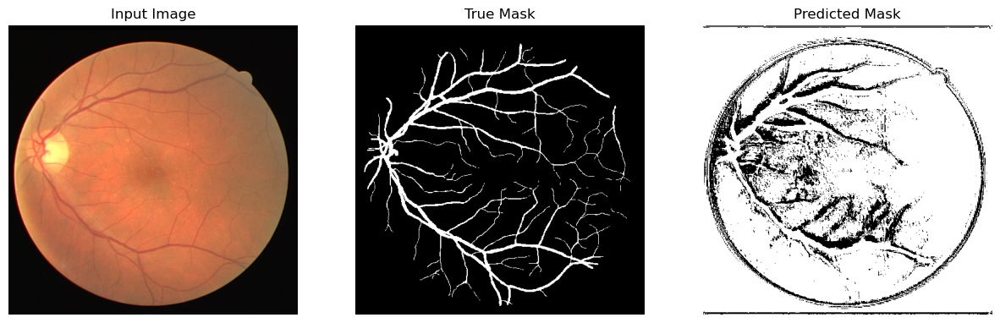


Sample Prediction after epoch 10

2/2 [==============================] - 2s 1s/step - loss: 0.4060 - accuracy: 0.9158
Epoch 11/30
2/2 [==============================] - 1s 422ms/step - loss: 0.3996 - accuracy: 0.9188
Epoch 12/30
2/2 [==============================] - 1s 436ms/step - loss: 0.3917 - accuracy: 0.9235
Epoch 13/30
1/1 [==============================] - 0s 69ms/stepss: 0.3858 - accuracy: 0.92


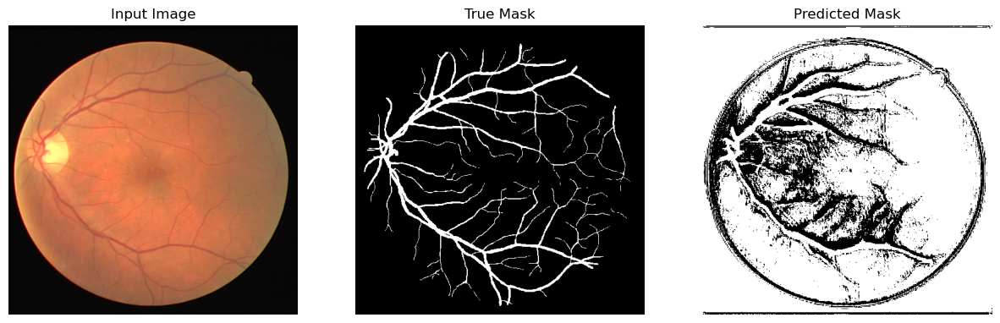


Sample Prediction after epoch 13

2/2 [==============================] - 2s 1s/step - loss: 0.3858 - accuracy: 0.9266
Epoch 14/30
2/2 [==============================] - 1s 423ms/step - loss: 0.3795 - accuracy: 0.9293
Epoch 15/30
2/2 [==============================] - 1s 435ms/step - loss: 0.3735 - accuracy: 0.9315
Epoch 16/30
1/1 [==============================] - 0s 71ms/stepss: 0.3681 - accuracy: 0.93


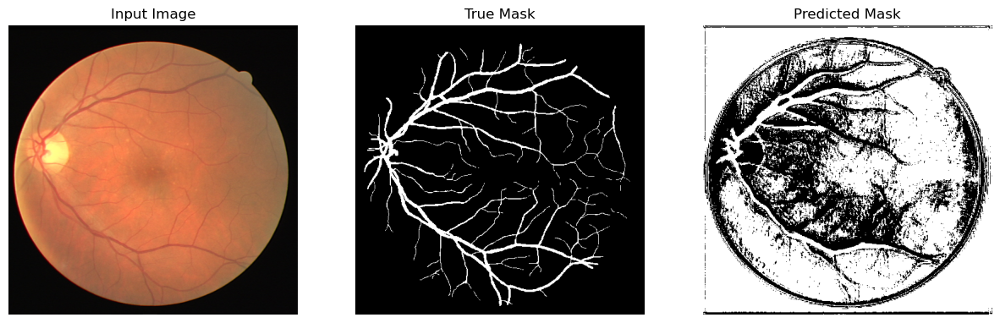


Sample Prediction after epoch 16

2/2 [==============================] - 2s 1s/step - loss: 0.3681 - accuracy: 0.9337
Epoch 17/30
2/2 [==============================] - 1s 436ms/step - loss: 0.3630 - accuracy: 0.9361
Epoch 18/30
2/2 [==============================] - 1s 422ms/step - loss: 0.3580 - accuracy: 0.9387
Epoch 19/30
1/1 [==============================] - 0s 61ms/stepss: 0.3534 - accuracy: 0.94


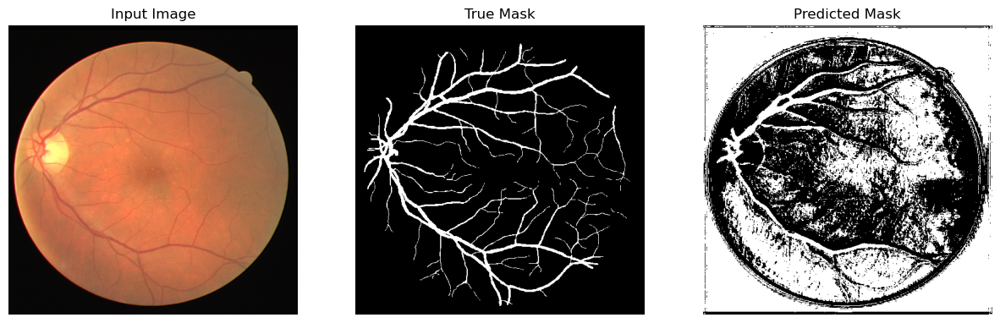


Sample Prediction after epoch 19

2/2 [==============================] - 2s 1s/step - loss: 0.3534 - accuracy: 0.9408
Epoch 20/30
2/2 [==============================] - 1s 438ms/step - loss: 0.3491 - accuracy: 0.9422
Epoch 21/30
2/2 [==============================] - 1s 436ms/step - loss: 0.3447 - accuracy: 0.9438
Epoch 22/30
1/1 [==============================] - 0s 69ms/stepss: 0.3406 - accuracy: 0.94


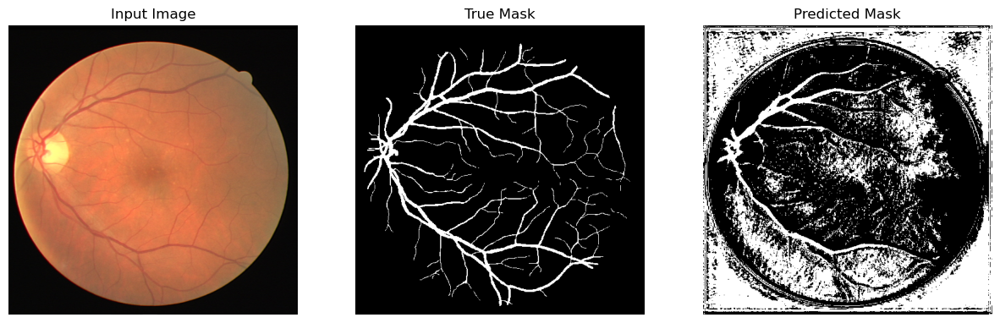


Sample Prediction after epoch 22

2/2 [==============================] - 2s 1s/step - loss: 0.3406 - accuracy: 0.9451
Epoch 23/30
2/2 [==============================] - 1s 437ms/step - loss: 0.3388 - accuracy: 0.9460
Epoch 24/30
2/2 [==============================] - 1s 435ms/step - loss: 0.3340 - accuracy: 0.9483
Epoch 25/30
1/1 [==============================] - 0s 69ms/stepss: 0.3299 - accuracy: 0.94


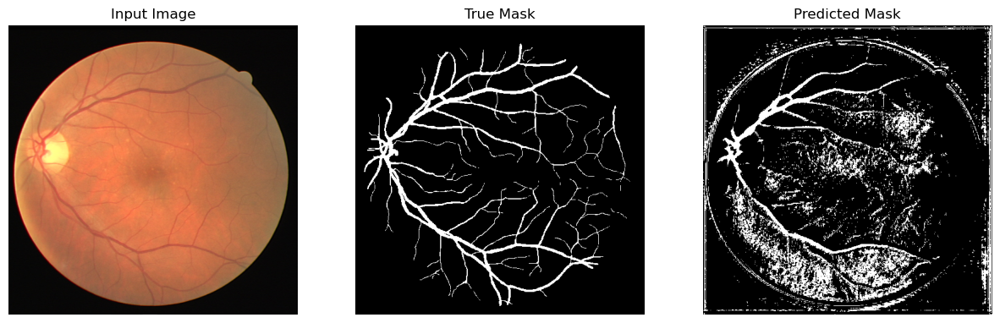


Sample Prediction after epoch 25

2/2 [==============================] - 2s 1s/step - loss: 0.3299 - accuracy: 0.9491
Epoch 26/30
2/2 [==============================] - 1s 422ms/step - loss: 0.3261 - accuracy: 0.9493
Epoch 27/30
2/2 [==============================] - 1s 437ms/step - loss: 0.3226 - accuracy: 0.9503
Epoch 28/30
1/1 [==============================] - 0s 72ms/stepss: 0.3194 - accuracy: 0.95


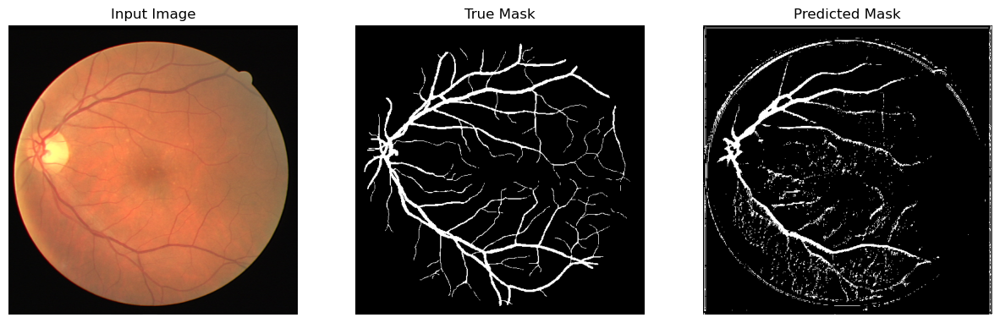


Sample Prediction after epoch 28

2/2 [==============================] - 2s 1s/step - loss: 0.3194 - accuracy: 0.9515
Epoch 29/30
2/2 [==============================] - 1s 436ms/step - loss: 0.3161 - accuracy: 0.9529
Epoch 30/30
2/2 [==============================] - 1s 425ms/step - loss: 0.3132 - accuracy: 0.9539


In [ ]:
optim = keras.optimizers.Adam(0.0001)
bce   = keras.losses.BinaryCrossentropy()
metrics = ["accuracy"]

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, bce, metrics)

model.fit(
    train_dataset,
    callbacks=[DisplayCallback(train_dataset)],
    epochs=30
)

In [ ]:
!gdown --id 1kkhth42uKJDPCVBH6TqPaYrAXYLJyv7H
def Visaul(image, output_image):
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.subplot(1, 2, 2)
    plt.imshow(output_image,cmap="gray")
#     plt.savefig('example_plot.png')
    plt.show()

/bin/bash: gdown: command not found


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Use keyword parameter `sigmas` instead of `scale_range` and `scale_range` which will be removed in version 0.17.
  if __name__ == "__main__":


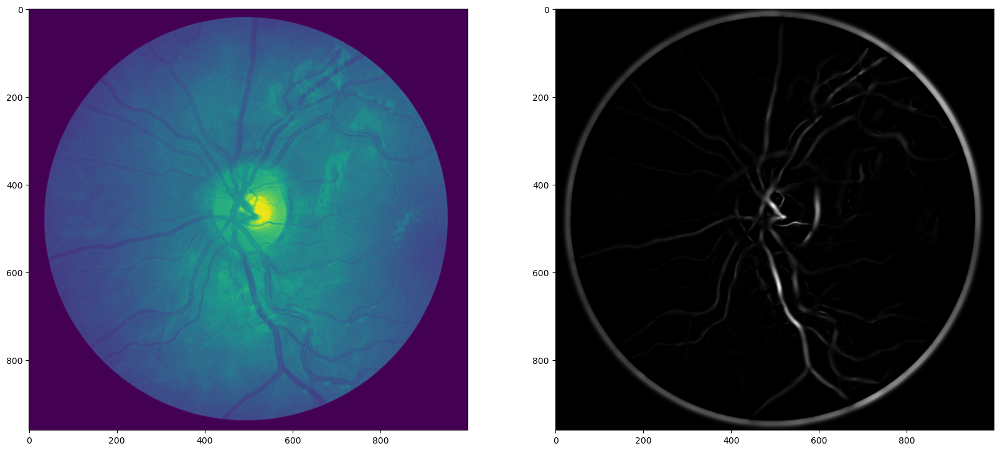

In [ ]:
import cv2
import numpy as np
from skimage.filters import frangi

# Load the image
img = cv2.imread('/kaggle/input/retinal-vessel-segmentation/CHASE_DB1/Images/Image_03L.jpg', cv2.IMREAD_GRAYSCALE)

# Apply Frangi filter to enhance vessels
img_enhanced = frangi(img, scale_range=(1, 10), scale_step=2, beta=0.5)
img_enhanced = img_enhanced*255

Visaul(img,img_enhanced)